<a href="https://colab.research.google.com/github/megmarv/PsychoAI-/blob/Image-Retrieval/GroupImgProcessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import cv2
import dlib
from PIL import Image, ImageSequence  # Correct import for handling GIFs
from google.colab.patches import cv2_imshow  # Comment out if running outside Colab
from google.colab import drive

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set folder paths
input_folder = "/content/drive/MyDrive/Group Photos"  # Folder containing the input group photos
output_folder = "/content/drive/MyDrive/extracted_group_faces"  # Folder to save the extracted faces
os.makedirs(output_folder, exist_ok=True)

In [ ]:
# Initialize the Dlib face detector
detector = dlib.get_frontal_face_detector()

In [ ]:
def process_frame(frame, frame_number, file_name):
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale frame
    faces = detector(gray_frame)

    if not faces:
        print(f"No faces detected in frame {frame_number} of {file_name}.")
        return

    for i, face in enumerate(faces):
        x, y, w, h = (face.left(), face.top(), face.width(), face.height())
        face_img = frame[y:y+h, x:x+w]  # Crop the face from the original frame (to retain color structure)

        # Convert the cropped face image to grayscale explicitly
        face_img_gray = cv2.cvtColor(face_img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale

        # Define output path for each face
        face_output_path = os.path.join(output_folder, f"{os.path.splitext(file_name)[0]}_frame_{frame_number}_face_{i+1}.jpg")

        # Save the grayscale face image
        cv2.imwrite(face_output_path, face_img_gray)
        print(f"Saved grayscale face {i+1} from frame {frame_number} of {file_name} to: {face_output_path}")

    # Optionally, draw rectangles around detected faces for visualization
    for face in faces:
        x, y, w, h = (face.left(), face.top(), face.width(), face.height())
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)  # Green rectangles

    # Display the image with detected faces outlined (for visualization)
    cv2_imshow(frame)  # Comment out if not using Colab


Saved grayscale face 1 from frame 0 of group-of-people-18.jpg to: /content/drive/MyDrive/extracted_group_faces/group-of-people-18_frame_0_face_1.jpg
Saved grayscale face 2 from frame 0 of group-of-people-18.jpg to: /content/drive/MyDrive/extracted_group_faces/group-of-people-18_frame_0_face_2.jpg
Saved grayscale face 3 from frame 0 of group-of-people-18.jpg to: /content/drive/MyDrive/extracted_group_faces/group-of-people-18_frame_0_face_3.jpg
Saved grayscale face 4 from frame 0 of group-of-people-18.jpg to: /content/drive/MyDrive/extracted_group_faces/group-of-people-18_frame_0_face_4.jpg
Saved grayscale face 5 from frame 0 of group-of-people-18.jpg to: /content/drive/MyDrive/extracted_group_faces/group-of-people-18_frame_0_face_5.jpg
Saved grayscale face 6 from frame 0 of group-of-people-18.jpg to: /content/drive/MyDrive/extracted_group_faces/group-of-people-18_frame_0_face_6.jpg
Saved grayscale face 7 from frame 0 of group-of-people-18.jpg to: /content/drive/MyDrive/extracted_group_f

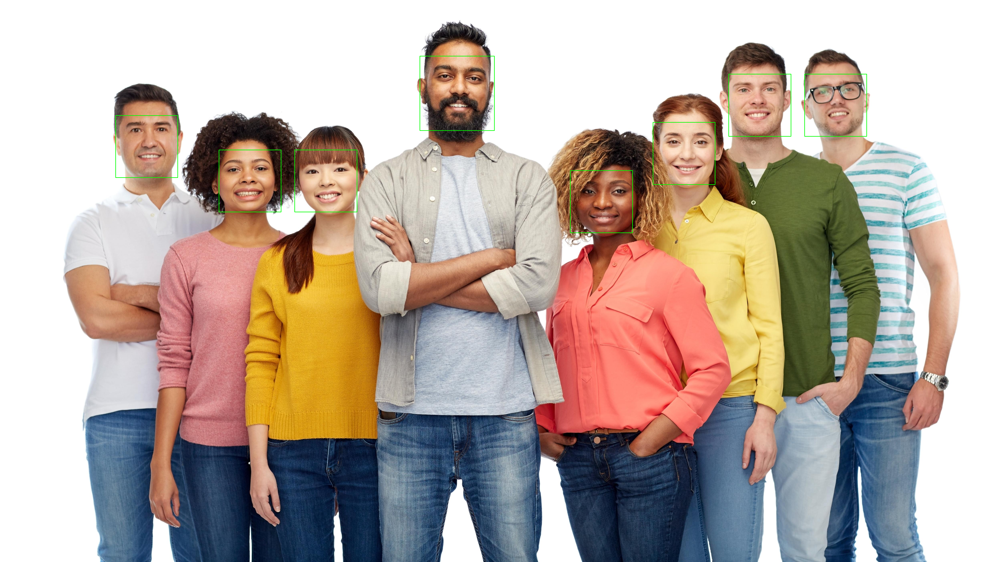

In [ ]:
# Process each image in the input folder
for file_name in os.listdir(input_folder):
    file_path = os.path.join(input_folder, file_name)

    try:
        # Handle GIF files separately
        if file_name.lower().endswith('.gif'):
            with Image.open(file_path) as img:
                for frame_number, frame in enumerate(ImageSequence.Iterator(img)):
                    frame = cv2.cvtColor(np.array(frame.convert('RGB')), cv2.COLOR_RGB2BGR)
                    process_frame(frame, frame_number, file_name)

        else:
            # Handle non-GIF images
            original_img = cv2.imread(file_path)

            if original_img is None:
                print(f"Skipping file {file_name} as it is not a valid image.")
                continue

            process_frame(original_img, 0, file_name)

    except Exception as e:
        print(f"Failed to process {file_name}: {e}")